# **EDA Notebook**

## Objectives

* To cary out an EDA using Pandas profiling and correlation studies in order to answer business requirement 1:

   -  The client is interested in identifying the key factors that contribute to patients readmissions. 

## Inputs

* outputs/dataset/collection/HospitalReadmissions.csv 

## Outputs

* Plots for the dashboard.

## Additional Comments

* In case you have any additional comments that don't fit in the previous bullets, please state them here. 


---

# Change working directory

We need to change the working directory from its current folder to its parent folder
* We access the current directory with os.getcwd()

In [1]:
import os
current_dir = os.getcwd()
current_dir

'c:\\Users\\Andrias\\Desktop\\patient-readmission\\jupyter_notebooks'

We want to make the parent of the current directory the new current directory
* os.path.dirname() gets the parent directory
* os.chir() defines the new current directory

In [2]:
os.chdir(os.path.dirname(current_dir))
print("You set a new current directory")

You set a new current directory


Confirm the new current directory

In [3]:
current_dir = os.getcwd()
current_dir

'c:\\Users\\Andrias\\Desktop\\patient-readmission'

---

# Load the dataset

Load the dataset that was saved at the end of the previous notebook.

In [4]:
import pandas as pd

df = pd.read_csv("outputs/datasets/collection/HospitalReadmissions.csv")
df.head()

,age,time_in_hospital,n_lab_procedures,n_procedures,n_medications,n_outpatient,n_inpatient,n_emergency,medical_specialty,diag_1,diag_2,diag_3,glucose_test,A1Ctest,change,diabetes_med,readmitted
0,[70-80),8,72,1,18,2,0,0,Missing,Circulatory,Respiratory,Other,no,no,no,yes,0
1,[70-80),3,34,2,13,0,0,0,Other,Other,Other,Other,no,no,no,yes,0
2,[50-60),5,45,0,18,0,0,0,Missing,Circulatory,Circulatory,Circulatory,no,no,yes,yes,1
3,[70-80),2,36,0,12,1,0,0,Missing,Circulatory,Other,Diabetes,no,no,yes,yes,1
4,[60-70),1,42,0,7,0,0,0,InternalMedicine,Other,Circulatory,Respiratory,no,no,no,yes,0


---

# Pandas Profiling

In order to better understand the dataset, data profiling is carried out using the ProfileReport class from the ydata_profiling library.

This will give an overview of the dataset and it's characteristics, analyse the features using statistical methods and investigate relationships between features

From the overview, we can see that there are no missing values or duplicated rows and there are 9 alerts.

* As we saw in the previous notebook the variable "medical_specialty" has no actual missing values, however nearly half of the rows are labelled "Missing", which potentially we may consider, later on, dropping this variable.
* In the alerts section we can see that "glucose_test" and "A1Ctest" are imbalanced, so potentially, we will need to apply feature scaling and engineering.
* Also the n_emergency is highly skewed and contains a lot of zeros, which will also need feature scaling and engineering. 
* Moving further down to the Correlations, we see the highest correlation between 2 variables, "change" and "diabetes_med" and we can see low to moderate correlation between out target variable, "readmitted", and the "n_inpatients" variable. This might indicate that we might struggle to find correlate features for our target variable. 
 

In [5]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Analysis of Features

Before we assess the correlation levels between our target variable and the features, we will first analyse the dataset's features.

* First we will identify outliers and check the distribution of the numerical features, using visualization and statistical methods and then handle them using appropriate techniques.
   - The techniques we will consider base on the analysis are to Remove the Outliers, Apply transformations or use the Winsorizer technique. 

* Then we will check the categorical features by plotting graphs. 

### Check for outliers

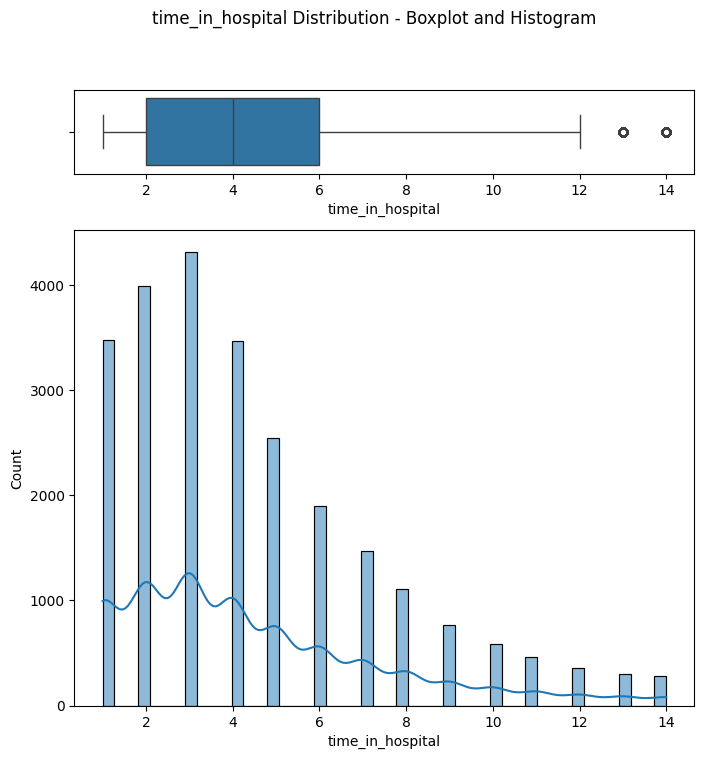

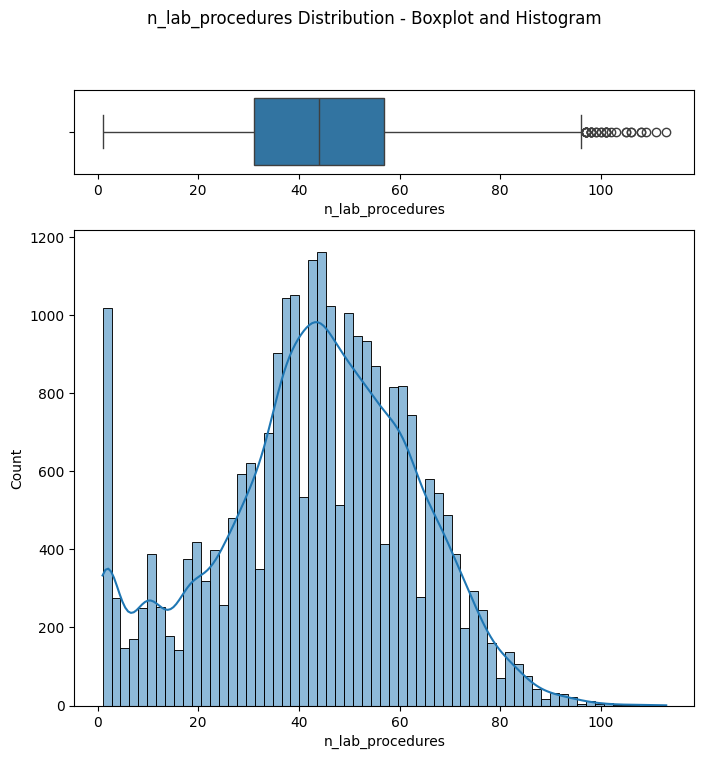

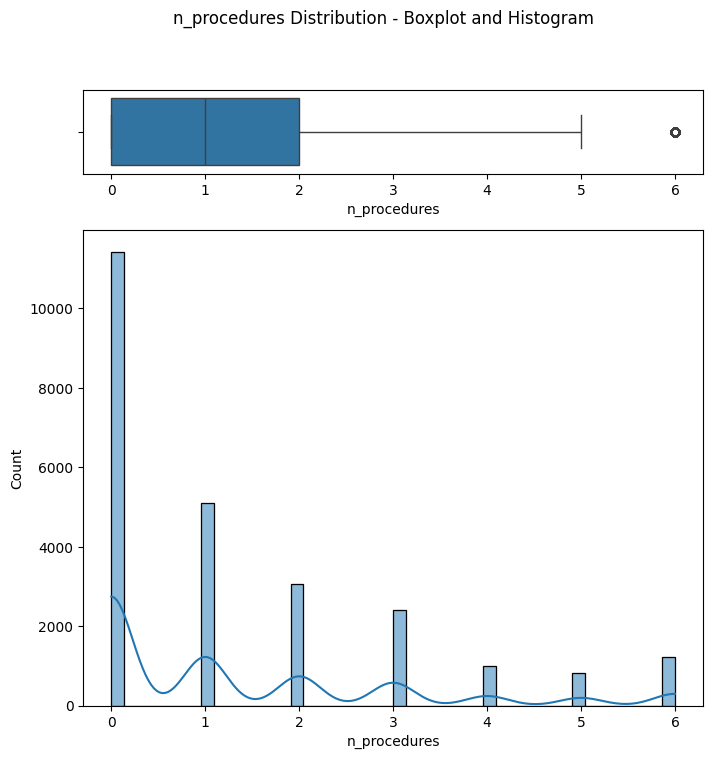

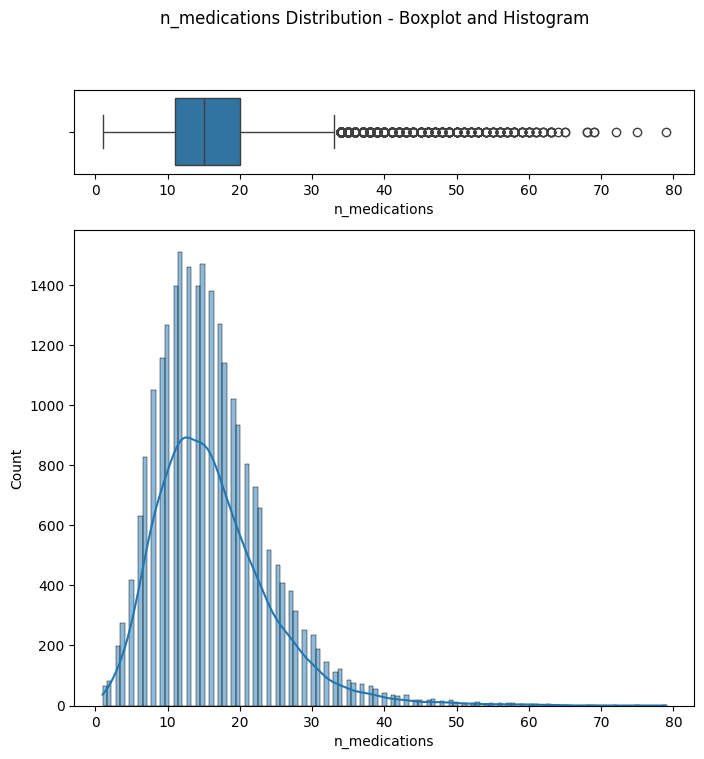

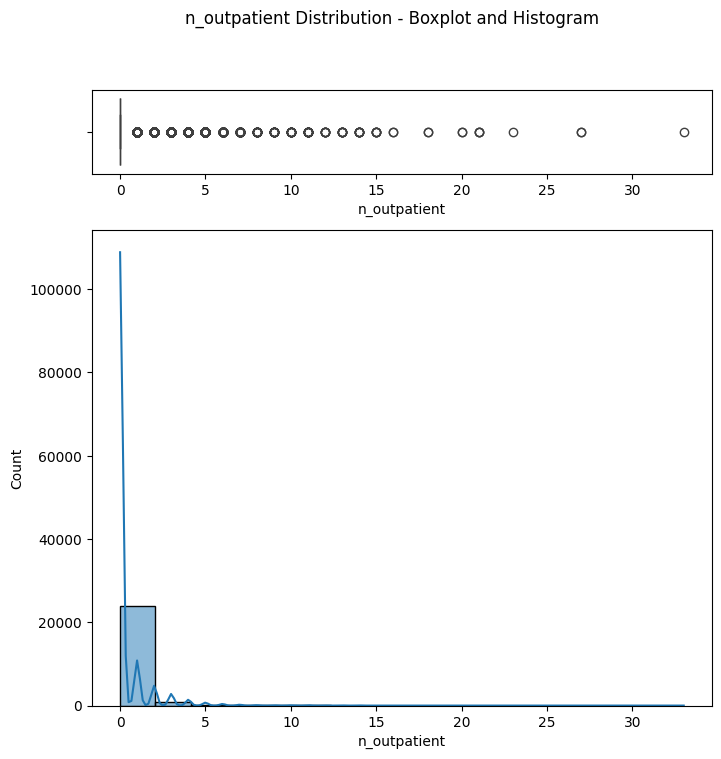

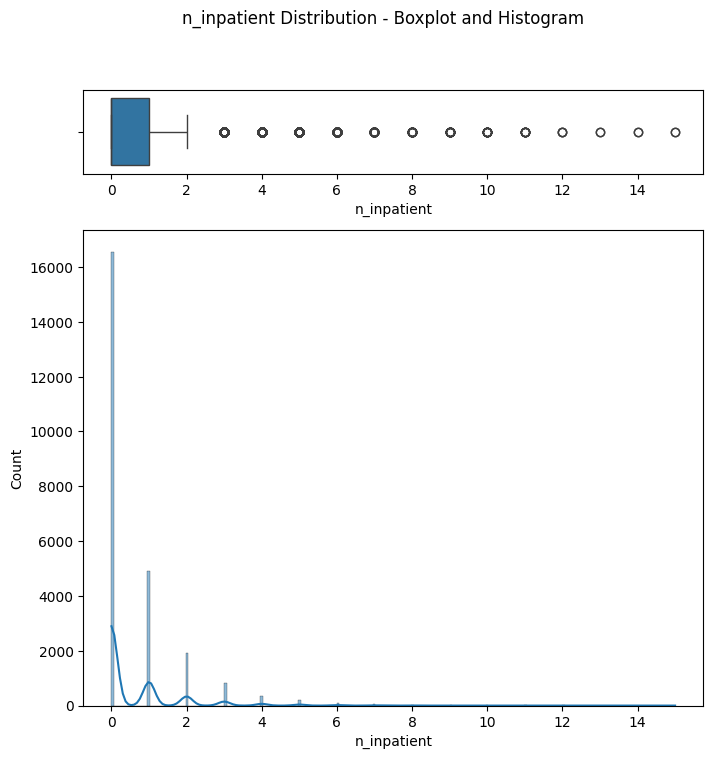

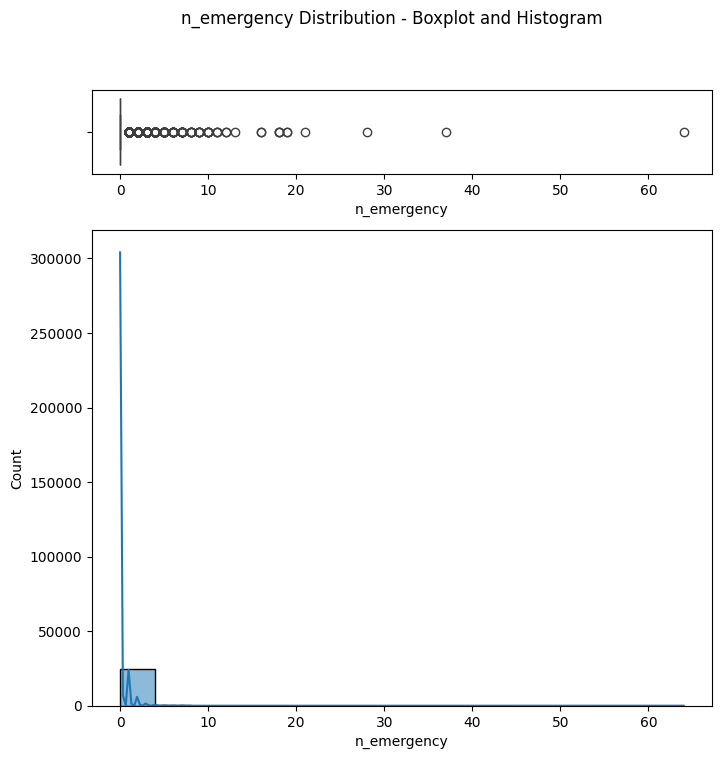

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

target_var = "readmitted"

df_features = df.drop(target_var, axis=1)

for col in df_features.select_dtypes(include="number").columns:
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(8,8), gridspec_kw={"height_ratios": (.15, .85)})
    sns.boxplot(data=df, x=col, ax=axes[0])
    sns.histplot(data=df, x=col, kde=True, ax=axes[1])
    fig.suptitle(f"{col} Distribution - Boxplot and Histogram")
    plt.show()
    print("\n")

The boxplots and histograms reveal tha the dataset contains a significant number of outliers, particularly in the columns "n_outpatient", "n_inpatient" and "n_emergency", and also that these variables are highly skewed.

In [7]:
df_numbers_features = df.select_dtypes(include='number').drop(target_var, axis=1)

def calc_skew_kurtosis(df, col):
    print(f"--{col}--\nSkewness: {df[col].skew().round(2)}\nKurtosis: {df[col].kurtosis().round(2)}\n")
    
def calc_IQR(df, col):
    return df[col].quantile(q=0.75) - df[col].quantile(q=0.25)

def calc_outliers(df):
    for col in df.columns:
        IQR = calc_IQR(df, col)
        below_q1 = 0
        above_q3 = 0

        for obs in df[col]:
            if obs < (df[col].quantile(q=0.25) - 1.5*IQR):
                below_q1 += 1
            elif obs > (df[col].quantile(q=0.75) + 1.5*IQR):
                above_q3 += 1

        calc_skew_kurtosis(df, col)
        print(f"There are {below_q1} outliers below Q1 - 1.5 * IQR")
        print(f"There are {above_q3} outliers above Q3 + 1.5 * IQR")
        print("\n")
        
calc_outliers(df_numbers_features)

--time_in_hospital--
Skewness: 1.11
Kurtosis: 0.8

There are 0 outliers below Q1 - 1.5 * IQR
There are 580 outliers above Q3 + 1.5 * IQR


--n_lab_procedures--
Skewness: -0.24
Kurtosis: -0.3

There are 0 outliers below Q1 - 1.5 * IQR
There are 33 outliers above Q3 + 1.5 * IQR


--n_procedures--
Skewness: 1.3
Kurtosis: 0.8

There are 0 outliers below Q1 - 1.5 * IQR
There are 1227 outliers above Q3 + 1.5 * IQR


--n_medications--
Skewness: 1.32
Kurtosis: 3.48

There are 0 outliers below Q1 - 1.5 * IQR
There are 844 outliers above Q3 + 1.5 * IQR


--n_outpatient--
Skewness: 7.3
Kurtosis: 95.93

There are 0 outliers below Q1 - 1.5 * IQR
There are 4141 outliers above Q3 + 1.5 * IQR


--n_inpatient--
Skewness: 3.25
Kurtosis: 16.45

There are 0 outliers below Q1 - 1.5 * IQR
There are 1628 outliers above Q3 + 1.5 * IQR


--n_emergency--
Skewness: 24.53
Kurtosis: 1310.59

There are 0 outliers below Q1 - 1.5 * IQR
There are 2728 outliers above Q3 + 1.5 * IQR




Display the above values using histograms.

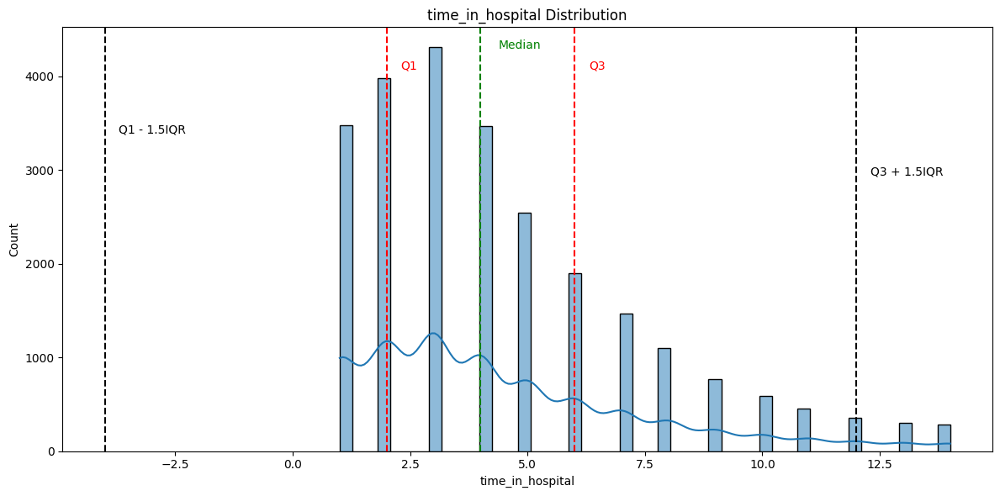

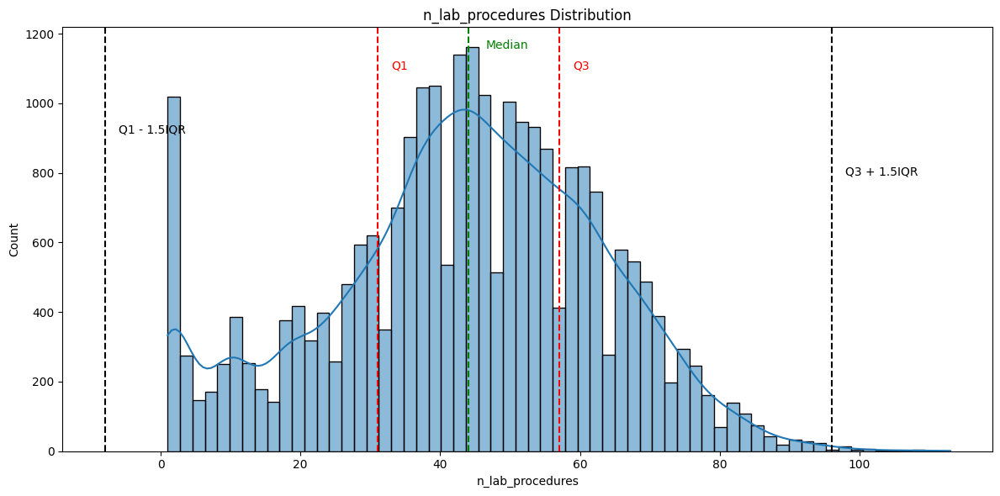

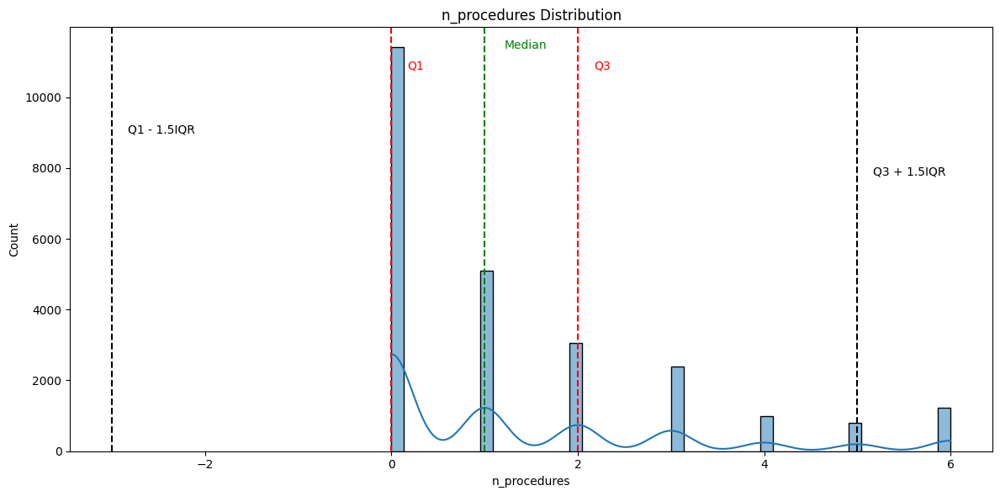

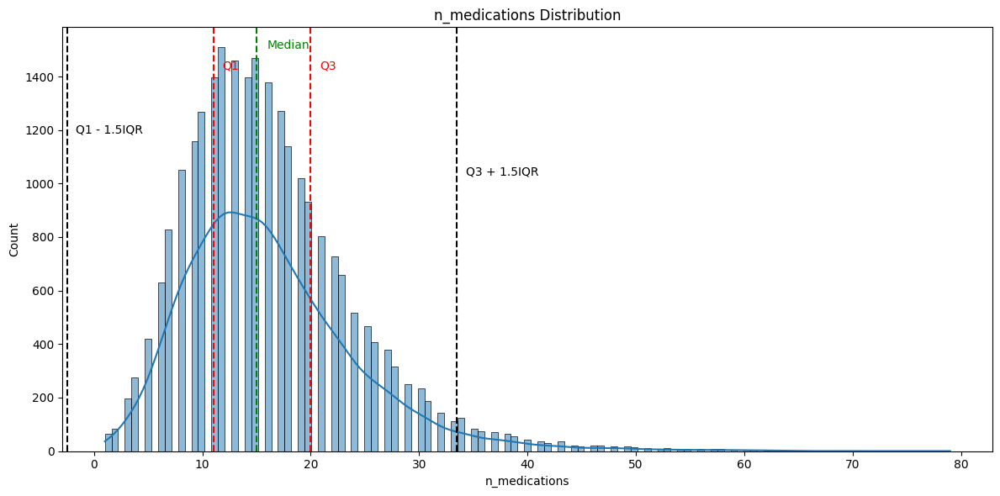

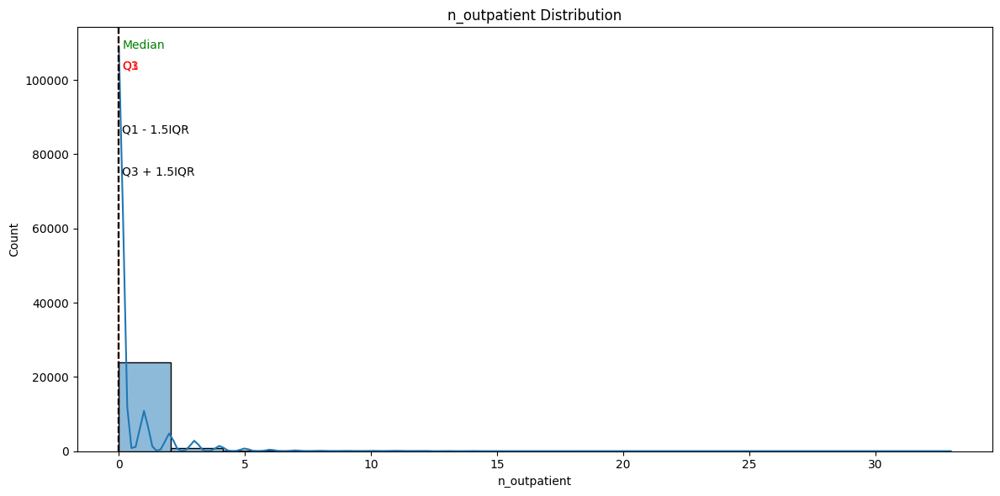

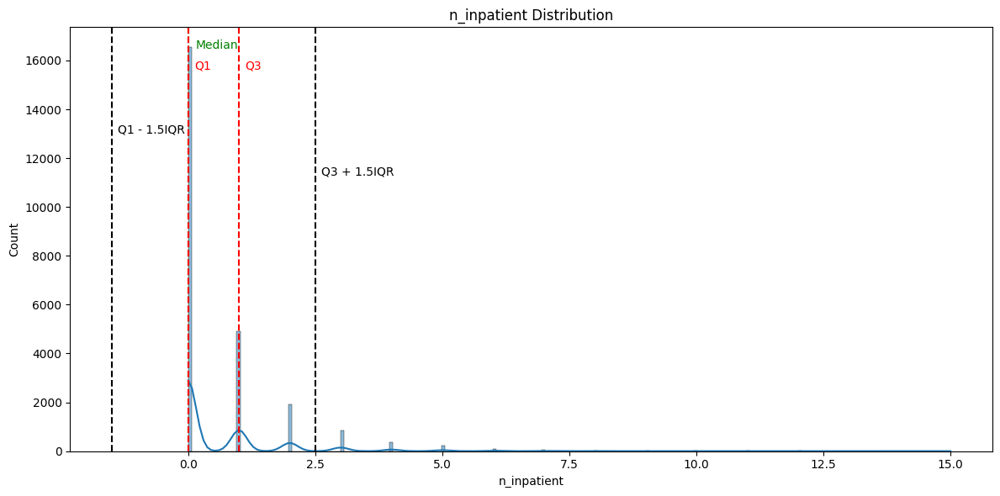

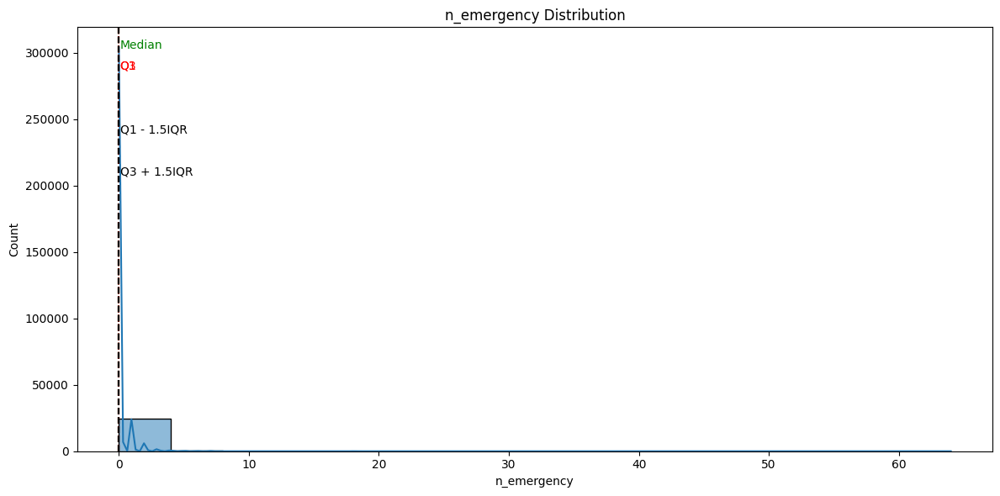

In [8]:
def plot_distribution(df, method=None):    
    for col in df:

        fig, axes = plt.subplots(figsize=(12,6))
        plt.title(f"{col} Distribution")
        sns.histplot(data=df, x=col, kde=True)

        plt.axvline(df[col].median(), color='g', linestyle='dashed', linewidth=1.5)
        plt.text(x=df[col].median() + df[col].std()/8 , y=axes.get_ylim()[1] * 0.95, s='Median', fontsize=10, c='g')

        IQR = df[col].quantile(q=0.75) - df[col].quantile(q=0.25)

        plt.axvline(df[col].quantile(q=0.25), color='r', linestyle='dashed', linewidth=1.5)
        plt.text(x=df[col].quantile(q=0.25) + df[col].std()/10, y=axes.get_ylim()[1] * 0.90, s="Q1", fontsize=10, c='r')

        plt.axvline(df[col].quantile(q=0.25) - 1.5*IQR, color='k', linestyle='dashed', linewidth=1.5)
        plt.text(x=df[col].quantile(q=0.25) - 1.5*IQR + df[col].std()/10, y=axes.get_ylim()[1] * 0.75, s="Q1 - 1.5IQR", fontsize=10, c='k')
        
        plt.axvline(df[col].quantile(q=0.75), color='r', linestyle='dashed', linewidth=1.5)
        plt.text(x=df[col].quantile(q=0.75) + df[col].std()/10, y=axes.get_ylim()[1] * 0.90, s="Q3", fontsize=10, c='r')

        plt.axvline(df[col].quantile(q=0.75) + 1.5*IQR, color='k', linestyle='dashed', linewidth=1.5)
        plt.text(x=df[col].quantile(q=0.75) + 1.5*IQR + df[col].std()/10, y=axes.get_ylim()[1] * 0.65, s="Q3 + 1.5IQR", fontsize=10, c='k')
        
        if method != None:
            plt.suptitle(f"{method}")
        plt.tight_layout()
        plt.show()
        
plot_distribution(df_numbers_features)

Below, I have decided to use the Winsorizer transformer, which caps the max and min values of a variable at automatically determined values, since our variable features have significant amount of outliers, and removing all of the outliers would have reduced a lot the amount of data.

Also, I'm using the Power Transformation and Yeo Johnson Transformation to achieve a more normalized distribution of the variables and also all the variable contain zeros. And these 2 transformers accept any positive number, including zeros. 

c:\Users\Andrias\AppData\Local\Programs\Python\Python312\Lib\site-packages\feature_engine\transformation\power.py:147: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[2.82842712 1.73205081 2.23606798 ... 2.23606798 1.41421356 3.16227766]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

c:\Users\Andrias\AppData\Local\Programs\Python\Python312\Lib\site-packages\feature_engine\transformation\power.py:147: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[8.48528137 5.83095189 6.70820393 ... 3.46410162 7.81024968 6.08276253]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

c:\Users\Andrias\AppData\Local\Programs\Python\Python312\Lib\site-packages\feature_engine\transformation\power.py:147: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise 

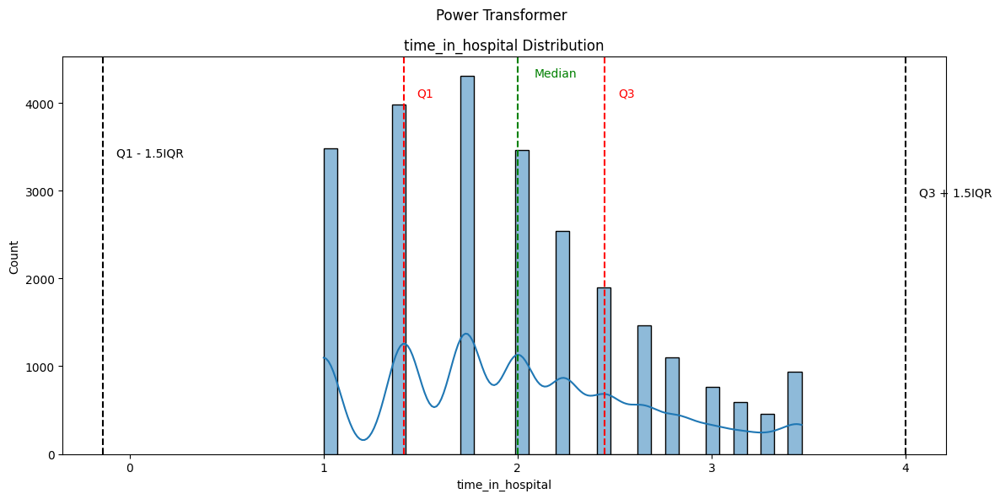

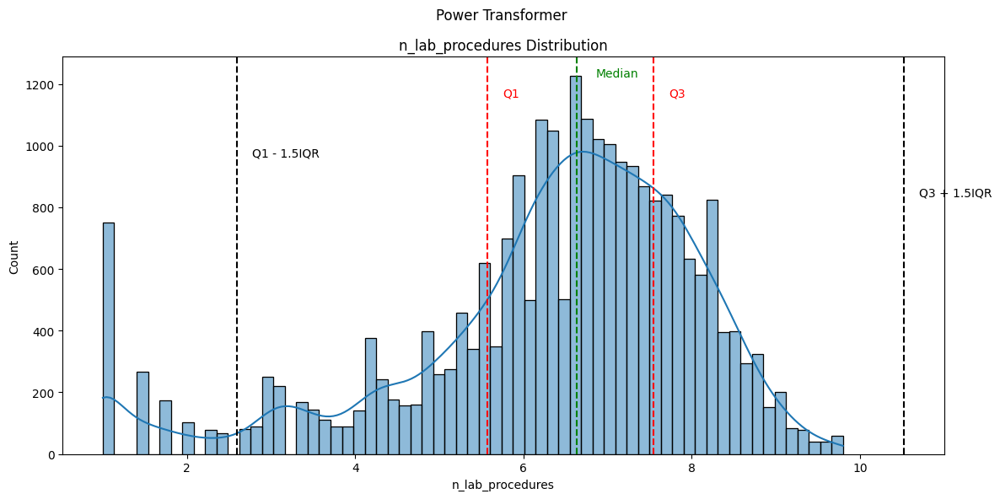

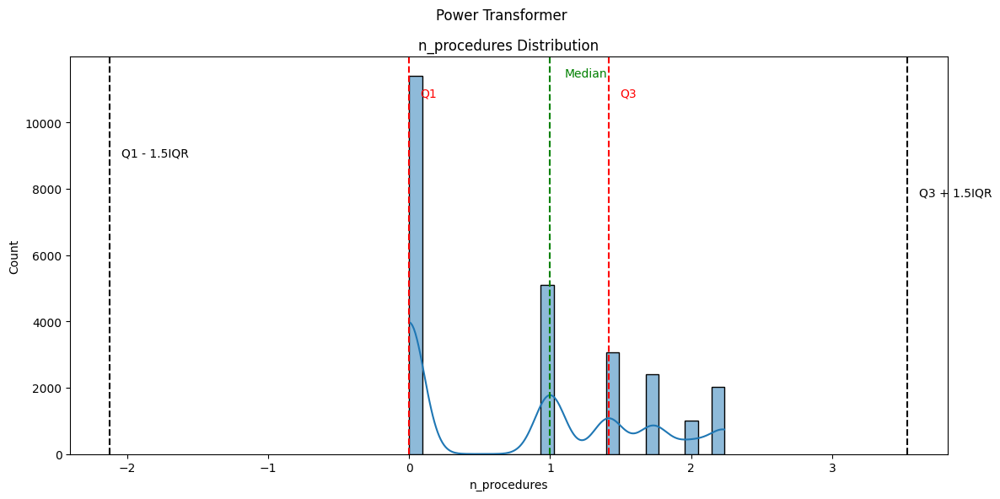

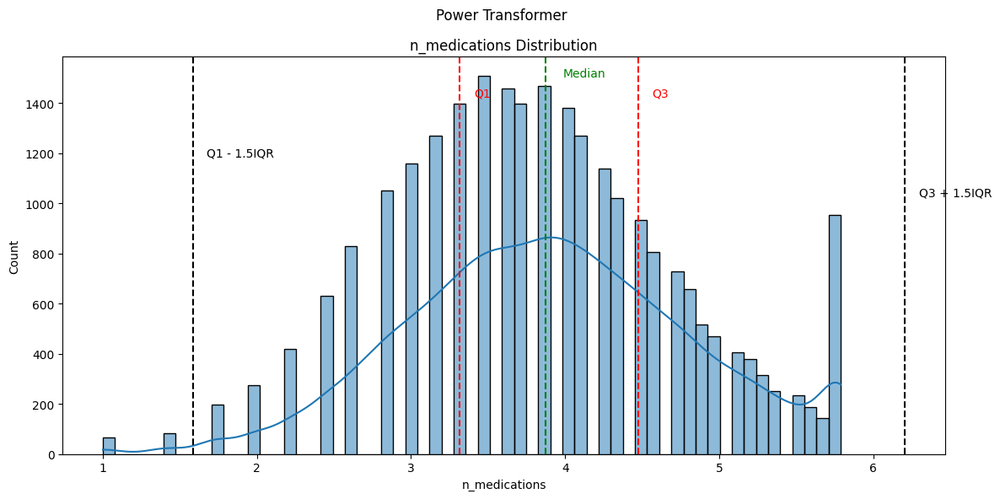

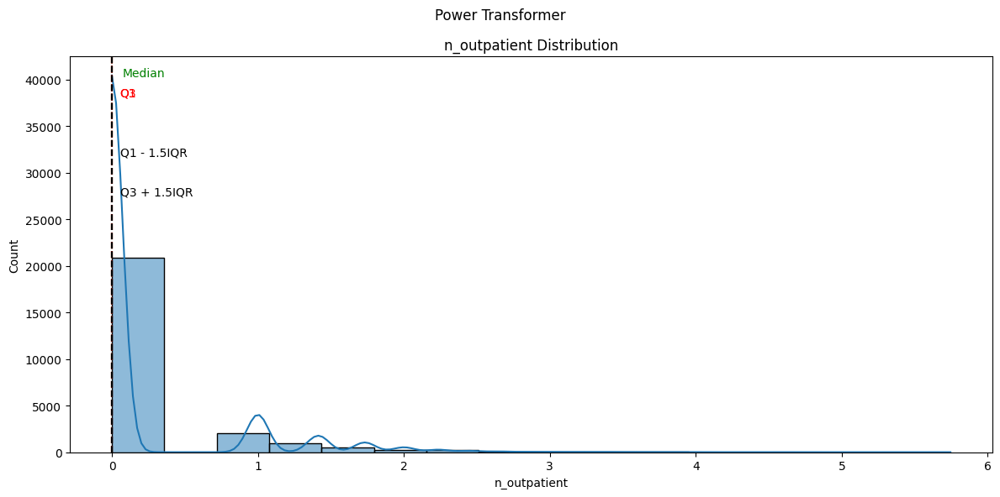

...

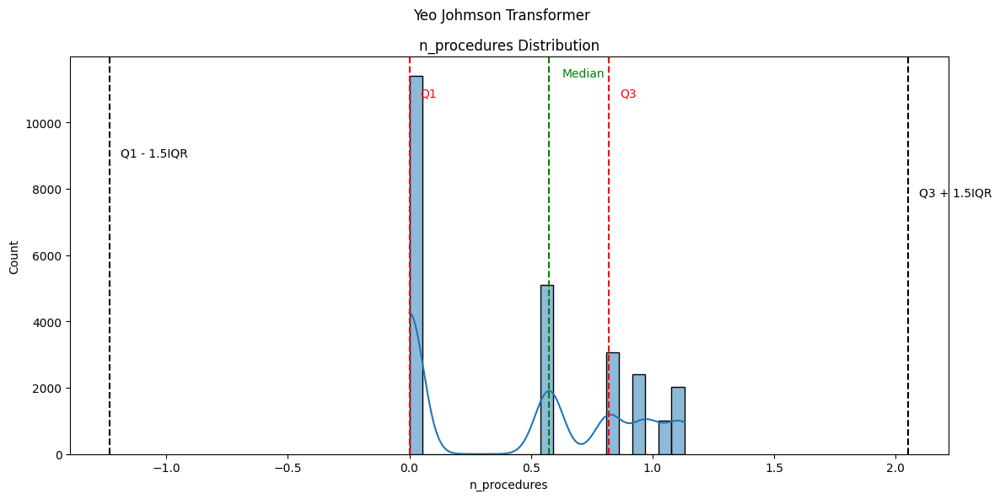

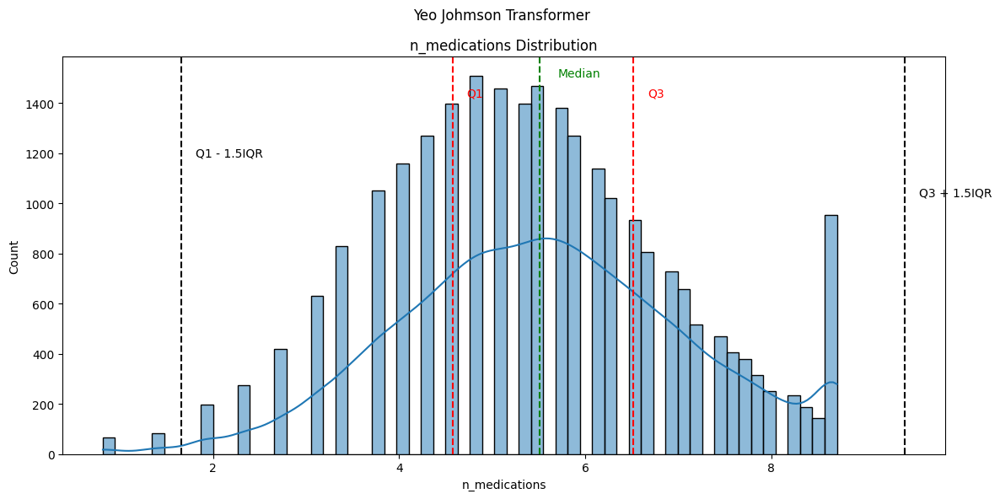

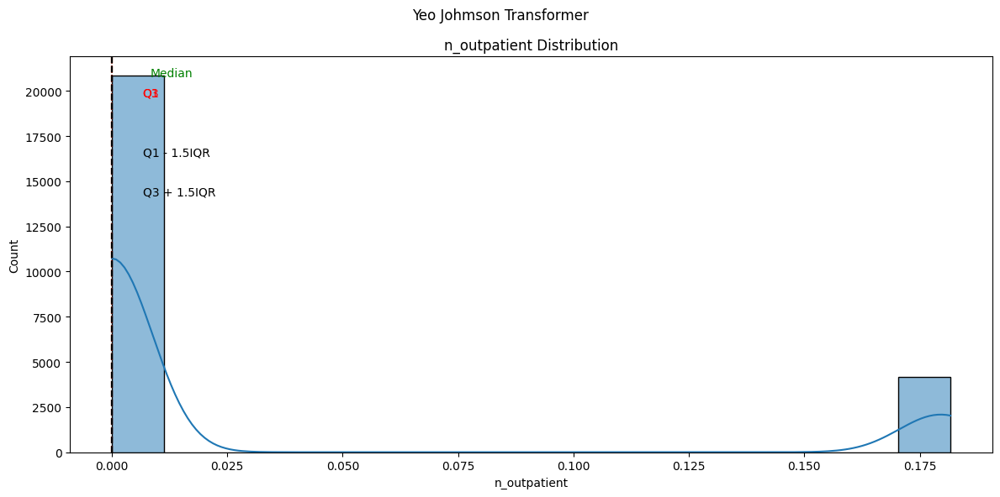

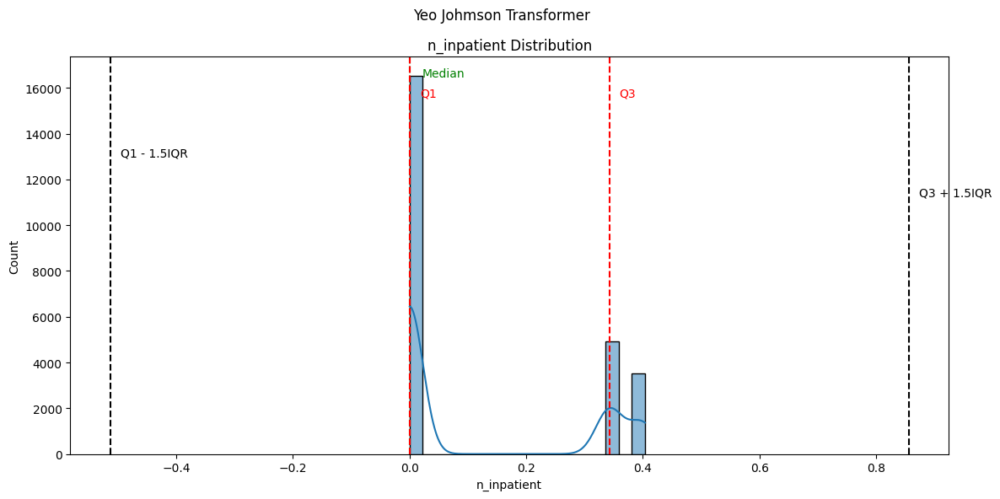

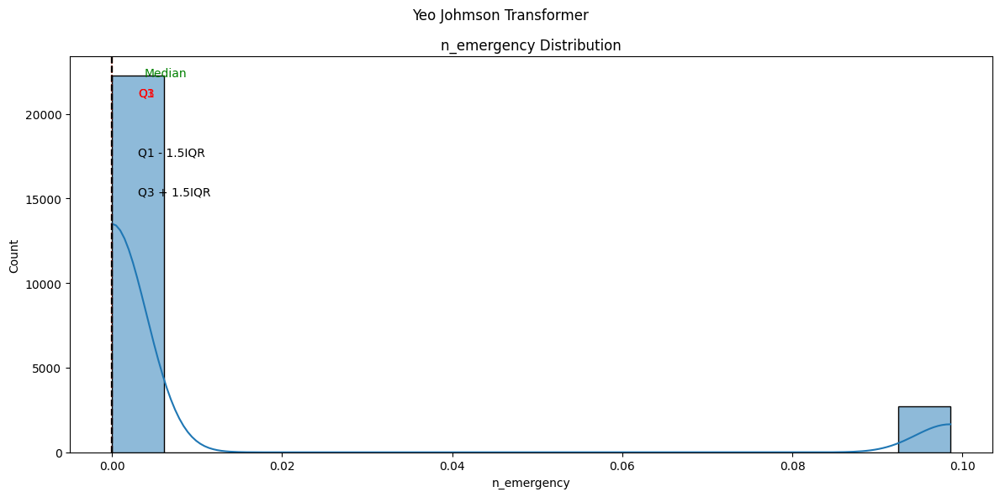

In [9]:
from sklearn.pipeline import Pipeline
from feature_engine.outliers import Winsorizer
from feature_engine.transformation import PowerTransformer, YeoJohnsonTransformer

transformations_list = [PowerTransformer(), YeoJohnsonTransformer()]
method_list = ['Power Transformer', 'Yeo Johmson Transformer']

def handle_display_numerical(df, transf_list):
    for item in transf_list:
        pipeline = Pipeline([
            ('Winsorizer', Winsorizer(variables=['time_in_hospital','n_lab_procedures','n_procedures','n_medications','n_inpatient'],
                                    capping_method='iqr',tail='both', fold=1.5)),
            ('transformation', item)
        ])
        
        transformed_df = pipeline.fit_transform(df)
        transform_method = method_list[transformations_list.index(item)]
        
        plot_distribution(transformed_df, transform_method)
        
handle_display_numerical(df_numbers_features, transformations_list)

From the plots above, it seems the Winsorizer transformer worked well with the outliers and that the Yeo Johnson transformation achieved better distribution of the variables. However, the 'n_emergency', 'n_inpatients', 'n_outpatients' and n_procedures still need further examination, since the transformer didn't really achieve normal distribution.

### Categorical features

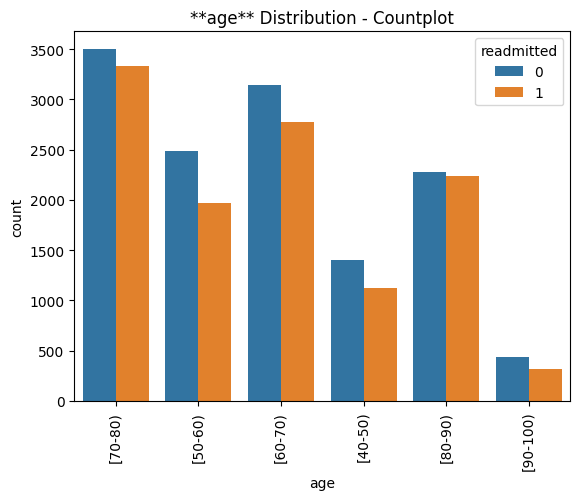

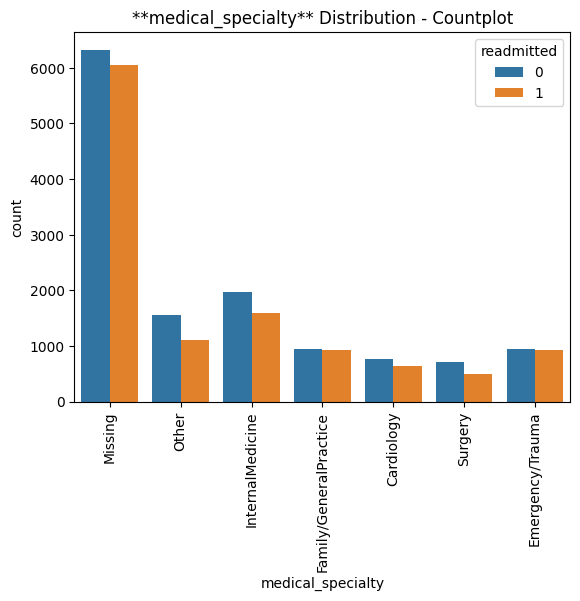

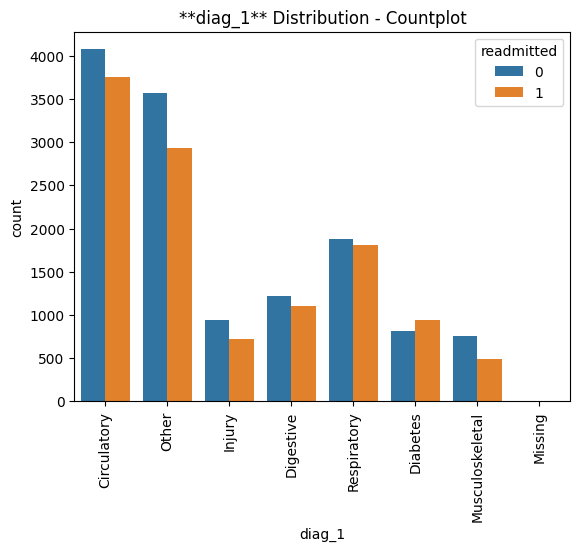

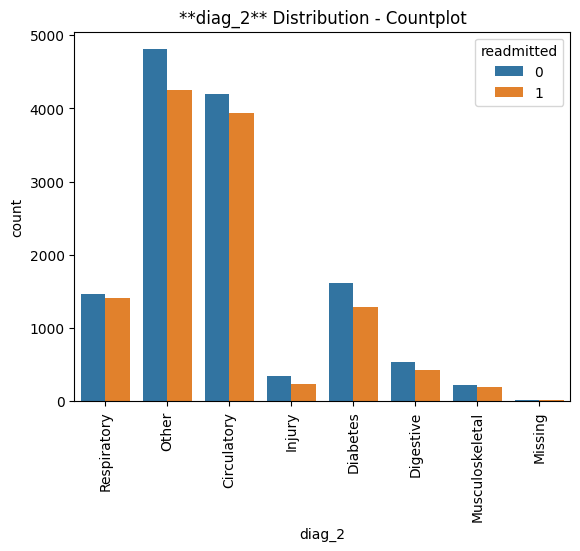

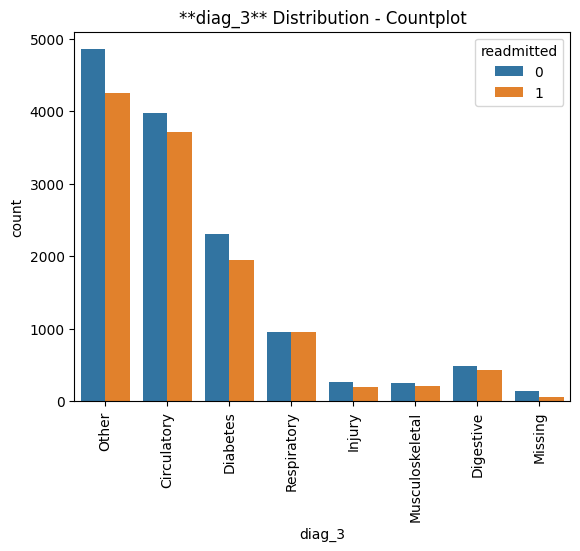

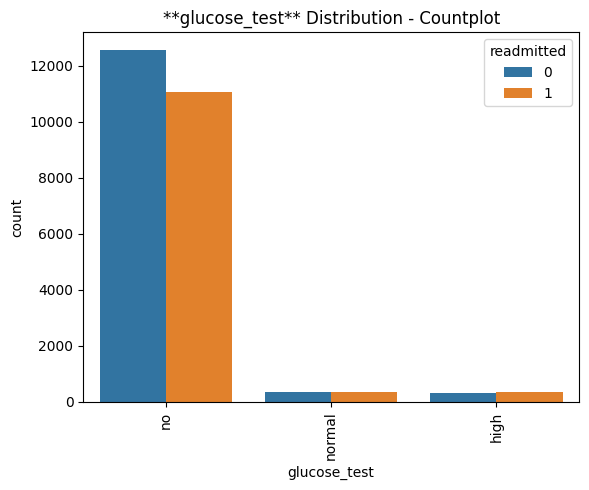

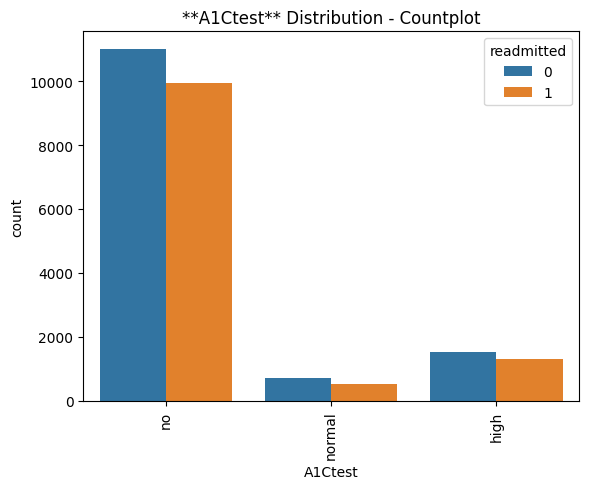

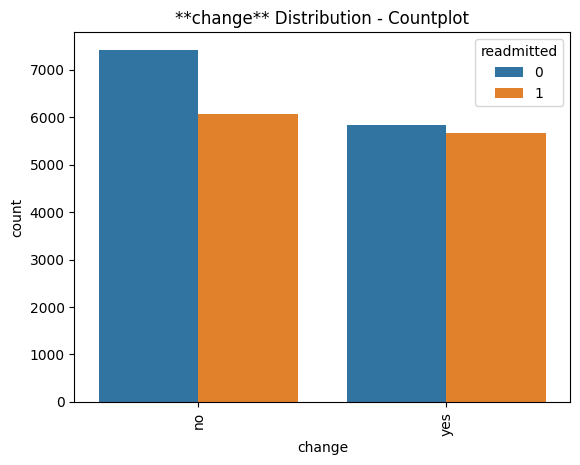

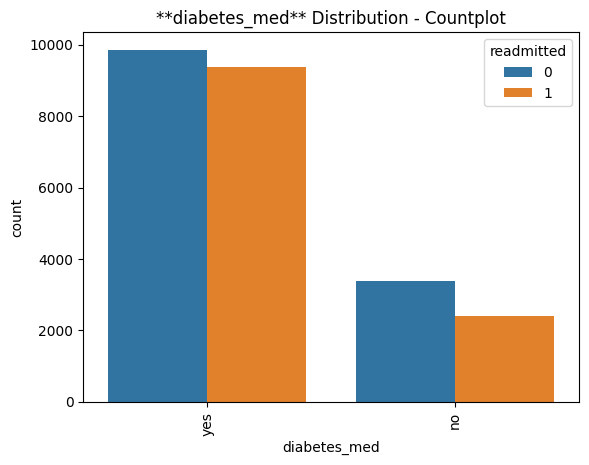

In [10]:
categorical_features = df_features.select_dtypes(include="object").columns.to_list()

for col in categorical_features:
    sns.countplot(data=df, x=col, hue=target_var)
    plt.title(f"**{col}** Distribution - Countplot")
    plt.xticks(rotation=90)
    plt.show()
    print("\n")

From the categorical features plots, we can see that the "medical_specialty" contains a lot of values labelled "Missing"and that 

In [11]:
pipeline_corr = Pipeline([
            ('Winsorizer', Winsorizer(variables=['time_in_hospital','n_lab_procedures','n_procedures','n_medications','n_inpatient'],
                                    capping_method='iqr',tail='both', fold=1.5)),
            ('YeoJohnsonTransformer', YeoJohnsonTransformer())
        ])

df_transformed = pipeline_corr.fit_transform(df_features)
df_correlation = df_transformed.copy()
df_correlation['readmitted'] = df['readmitted']
df_correlation.head()

,age,time_in_hospital,n_lab_procedures,n_procedures,n_medications,n_outpatient,n_inpatient,n_emergency,medical_specialty,diag_1,diag_2,diag_3,glucose_test,A1Ctest,change,diabetes_med,readmitted
0,[70-80),2.132823,73.992570,0.574519,6.135105,0.181237,0.0,0.0,Missing,Circulatory,Respiratory,Other,no,no,no,yes,0
1,[70-80),1.360470,34.745024,0.820627,5.062490,0.000000,0.0,0.0,Other,Other,Other,Other,no,no,no,yes,0
2,[50-60),1.748777,46.081258,0.000000,6.135105,0.000000,0.0,0.0,Missing,Circulatory,Circulatory,Circulatory,no,no,yes,yes,1
3,[70-80),1.082352,36.804231,0.000000,4.823662,0.177665,0.0,0.0,Missing,Circulatory,Other,Diabetes,no,no,yes,yes,1
4,[60-70),0.686651,42.987114,0.000000,3.441339,0.000000,0.0,0.0,InternalMedicine,Other,Circulatory,Respiratory,no,no,no,yes,0


### Correlation Study

In [17]:
from feature_engine.encoding import OneHotEncoder

ohe = OneHotEncoder(variables=categorical_features, drop_last=True)
df_ohe = ohe.fit_transform(df_correlation)
df_ohe.head()

,time_in_hospital,n_lab_procedures,n_procedures,n_medications,n_outpatient,n_inpatient,n_emergency,readmitted,age_[70-80),age_[50-60),...,diag_3_Respiratory,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Digestive,glucose_test_no,glucose_test_normal,A1Ctest_no,A1Ctest_normal,change_no,diabetes_med_yes
0,2.132823,73.992570,0.574519,6.135105,0.181237,0.0,0.0,0,1,0,...,0,0,0,0,1,0,1,0,1,1
1,1.360470,34.745024,0.820627,5.062490,0.000000,0.0,0.0,0,1,0,...,0,0,0,0,1,0,1,0,1,1
2,1.748777,46.081258,0.000000,6.135105,0.000000,0.0,0.0,1,0,1,...,0,0,0,0,1,0,1,0,0,1
3,1.082352,36.804231,0.000000,4.823662,0.177665,0.0,0.0,1,1,0,...,0,0,0,0,1,0,1,0,0,1
4,0.686651,42.987114,0.000000,3.441339,0.000000,0.0,0.0,0,0,0,...,1,0,0,0,1,0,1,0,1,1


In [18]:
corr_spearman = df_ohe.corr(method="spearman")["readmitted"].sort_values(ascending=False, key=abs)[1:].head(10)
corr_spearman

n_inpatient                  0.215550
n_outpatient                 0.118164
n_emergency                  0.113833
n_medications                0.065172
diabetes_med_yes             0.062145
time_in_hospital             0.053835
n_procedures                -0.047544
change_no                   -0.043214
medical_specialty_Other     -0.038313
medical_specialty_Missing    0.037585
Name: readmitted, dtype: float64

In [19]:
corr_pearson = df_ohe.corr(method="pearson")["readmitted"].sort_values(ascending=False, key=abs)[1:].head(10)
corr_pearson

n_inpatient                  0.207889
n_outpatient                 0.117443
n_emergency                  0.111676
diabetes_med_yes             0.062145
n_medications                0.060257
time_in_hospital             0.053727
n_procedures                -0.047308
change_no                   -0.043214
medical_specialty_Other     -0.038313
medical_specialty_Missing    0.037585
Name: readmitted, dtype: float64

In [20]:
top_n = 5
most_correlated_features = set(corr_spearman[:top_n].index.to_list() + corr_pearson[:top_n].index.to_list())
most_correlated_features

{'diabetes_med_yes',
 'n_emergency',
 'n_inpatient',
 'n_medications',
 'n_outpatient'}

To further understand the factors that might contribute towards patient's readmission, we will plot those features into graphs, colored by the target variable.

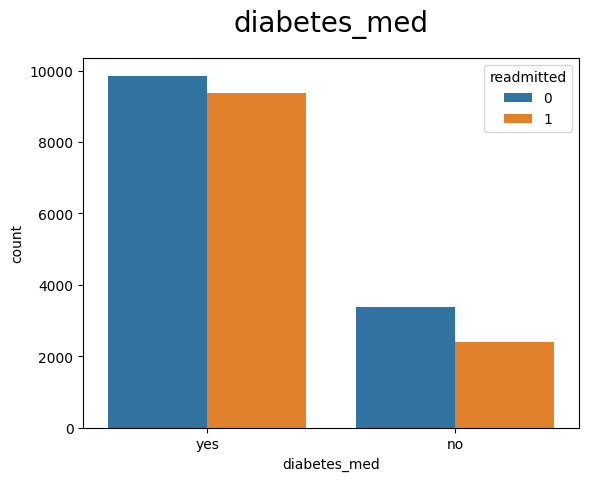

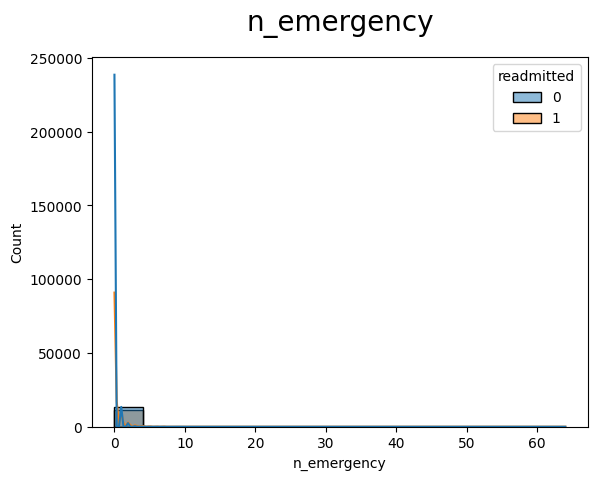

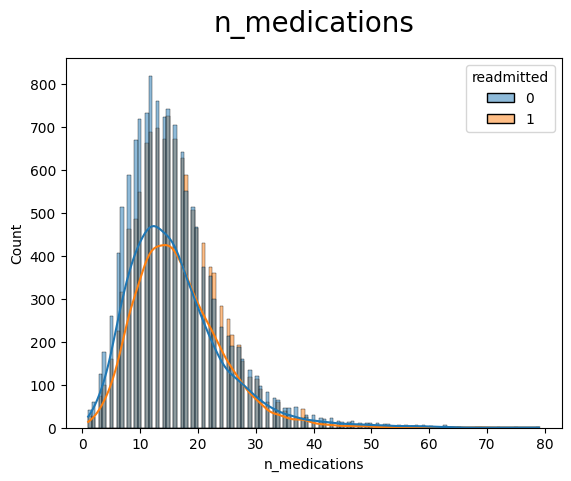

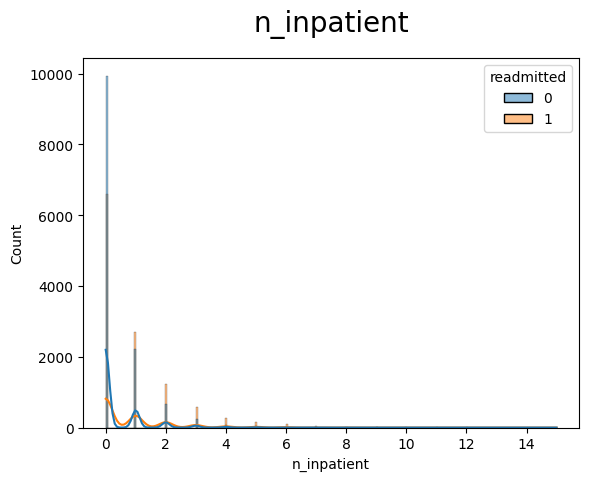

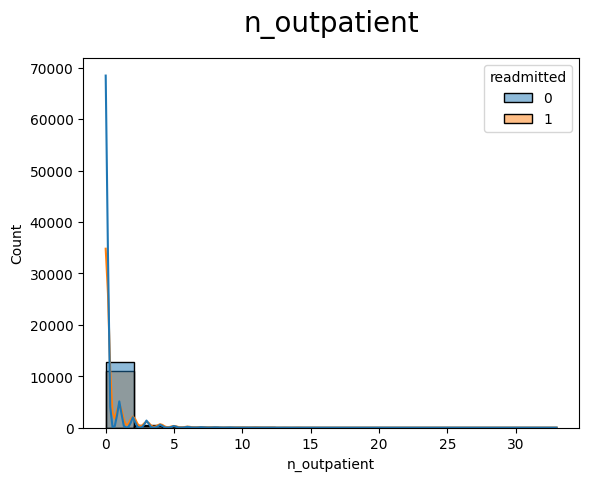

In [22]:
features_to_plot = ['diabetes_med', 'n_emergency', 'n_medications', 'n_inpatient', 'n_outpatient']

def plot_categorical(df, col):
    sns.countplot(df, x=col, hue=target_var)
    plt.title(f"{col}", fontsize=20, y=1.05)
    plt.show()

def plot_numerical(df, col):
    sns.histplot(df, x=col, kde=True, hue=target_var)
    plt.title(f"{col}", fontsize=20, y=1.05)
    plt.show()

for feature in features_to_plot:
    if df[feature].dtype == "object":
        plot_categorical(df, feature)
    else:
        plot_numerical(df, feature)

Below, to better visualize the patterns, we plot the above features to a parallel_categories() plot.

In [24]:
df_parallel = df.filter(features_to_plot)
df_parallel['readmitted'] = df['readmitted']
df_parallel.head()

,diabetes_med,n_emergency,n_medications,n_inpatient,n_outpatient,readmitted
0,yes,0,18,0,2,0
1,yes,0,13,0,0,0
2,yes,0,18,0,0,1
3,yes,0,12,0,1,1
4,yes,0,7,0,0,0


In [25]:
import plotly.express as px

fig = px.parallel_categories(df_parallel, color=target_var)
fig.show()

### Predictive Power Score

In [ ]:
import ppscore as pps

pps.matrix(df_correlation)

In [ ]:
matrix_df = pps.matrix(df)[['x', 'y', 'ppscore']].pivot(columns='x', index='y', values='ppscore')
sns.heatmap(matrix_df, vmin=0, vmax=1, cmap="Blues", linewidths=0.5, annot=True)

---

# Push files to Repo

* In case you don't need to push files to Repo, you may replace this section with "Conclusions and Next Steps" and state your conclusions and next steps.

In [ ]:
import os
try:
  # create here your folder
  # os.makedirs(name='')
except Exception as e:
  print(e)


---

## Conclusions

## Next Steps

Int he next notebook we will begin the Data Cleaning based on the EDA we performed here.